## Library and Data Importing

In [1]:
# Standard Python Libraries
import numpy as np
import pandas as pd

# Data Visualization Libraries
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# Data Preprocessing Libraries
from sklearn.preprocessing import StandardScaler

# Dimensionality Reduction Libraries
from sklearn.decomposition import PCA
import umap  # UMAP algorithm

# Clustering Libraries
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster

# Data Profiling Libraries
from ydata_profiling import ProfileReport  # For automated EDA (Exploratory Data Analysis)

# Custom Helper Functions
from helper_functions import print_boxed_text, save_boxed_text_to_file


/Users/leo/Programming/PLR/Leo/env/lib/python3.11/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/leo/Programming/PLR/Leo/env/lib/python3.11/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/leo/Programming/PLR/Leo/env/lib/python3.11/site-packages/umap/d

In [2]:
#import the data
data = pd.read_csv('../data/cleaned_data_SYMPTOMS_8_24_23.csv')

#drop unnamed column
data = data.drop(columns=['Unnamed: 0'])

## Data Exploration

In [3]:
data.shape

(6035, 165)

In [4]:
#check the types of data
data.dtypes

Symptom_Memory_short                  float64
Symptom_Memory_long                   float64
Symptom_Memory_no_new_memories        float64
Symptom_Memory_forget_tasks           float64
Symptom_Memory_other                  float64
                                       ...   
Symptom_SkinAllergy_other_itchy       float64
Symptom_SkinAllergy_shingles          float64
Symptom_PEM                             int64
Symptom_Fatigue                         int64
Symptom_Change_sensitivity_to_meds      int64
Length: 165, dtype: object

In [5]:
# Generate the profiling report
profile = ProfileReport(data)

# Save the report to an HTML file
profile.to_file(output_file='report.html')

profile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

/Users/leo/Programming/PLR/Leo/env/lib/python3.11/site-packages/ydata_profiling/model/pandas/duplicates_pandas.py:40: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  .reset_index(name=duplicates_key)
/Users/leo/Programming/PLR/Leo/env/lib/python3.11/site-packages/ydata_profiling/model/pandas/duplicates_pandas.py:40: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  .reset_index(name=duplicates_key)
/Users/leo/Programming/PLR/Leo/env/lib/python3.11/site-packages/ydata_profiling/model/pandas/duplicates_pandas.py:40: PerformanceWarning: 

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

## Remove Uninformative Variables

In [6]:
def drop_skewed_features(df, threshold=0.9):
    """
    Drop features that are skewed towards 0 or 1.
    
    Parameters:
        df (DataFrame): The input DataFrame with binary features.
        threshold (float): The skewness threshold. Features with skewness above this value will be dropped.
        
    Returns:
        DataFrame: A new DataFrame with skewed features removed.
    """
    lines = ["Dropped Skewed Features"]
    is_title = [True]
    
    dropped_features = []
    
    for col in df.columns:
        # Calculate the skewness for each feature
        skewness = df[col].mean()
        
        # Check if the feature is skewed towards 0 or 1
        if skewness > threshold or skewness < (1 - threshold):
            line = f"Dropping {col} with skewness {skewness:.4f}"
            lines.append(line)
            is_title.append(False)
            dropped_features.append(col)
            
    # Drop the skewed features
    df_dropped = df.drop(columns=dropped_features)
    
    print_boxed_text(lines, is_title)
    
    return df_dropped


threshold = 0.95  #Setting this to a very conservative 95% threshold would be good to discuss this as a team
data_unskewed = drop_skewed_features(data, threshold)

┌────────────────────────────────────────────────────────────────────────────┐
├────────────────────────────────────────────────────────────────────────────┤
│                          Dropped Skewed Features                           │
├────────────────────────────────────────────────────────────────────────────┤
│                                                                            │
│ Dropping Symptom_Speech_difficulty_finding_words with skewness 0.9510      │
│ Dropping Symptom_Sensations_facial_paralysis with skewness 0.0395          │
│ Dropping Symptom_New_anaphylaxis with skewness 0.0429                      │
│ Dropping Symptom_Coughing_up_blood with skewness 0.0479                    │
│ Dropping Symptom_coughing_up_blood with skewness 0.0499                    │
│ Dropping Symptom_Eye_Vision_tunnel_vision with skewness 0.0383             │
│ Dropping Symptom_Eye_Vision_loss_of_vision with skewness 0.0111            │
│ Dropping Symptom_Reproductive_early_menopause with

## Correlation Analysis

$$\Phi = \frac{(ad - bc)}{\sqrt{(a + b)(a + c)(b + d)(c + d)}}$$



I went with the Phi coefficient to figure out which symptoms are related because it's useful when working with binary data like ours. It's simple to interpret and commputationally efficient.  The formula essentially captures the difference between the observed frequency of coincident events and the frequency that would be expected if the variables were independent, normalized by what the maximum possible difference could be. This makes it an intuitive measure of how much one variable depends on another.

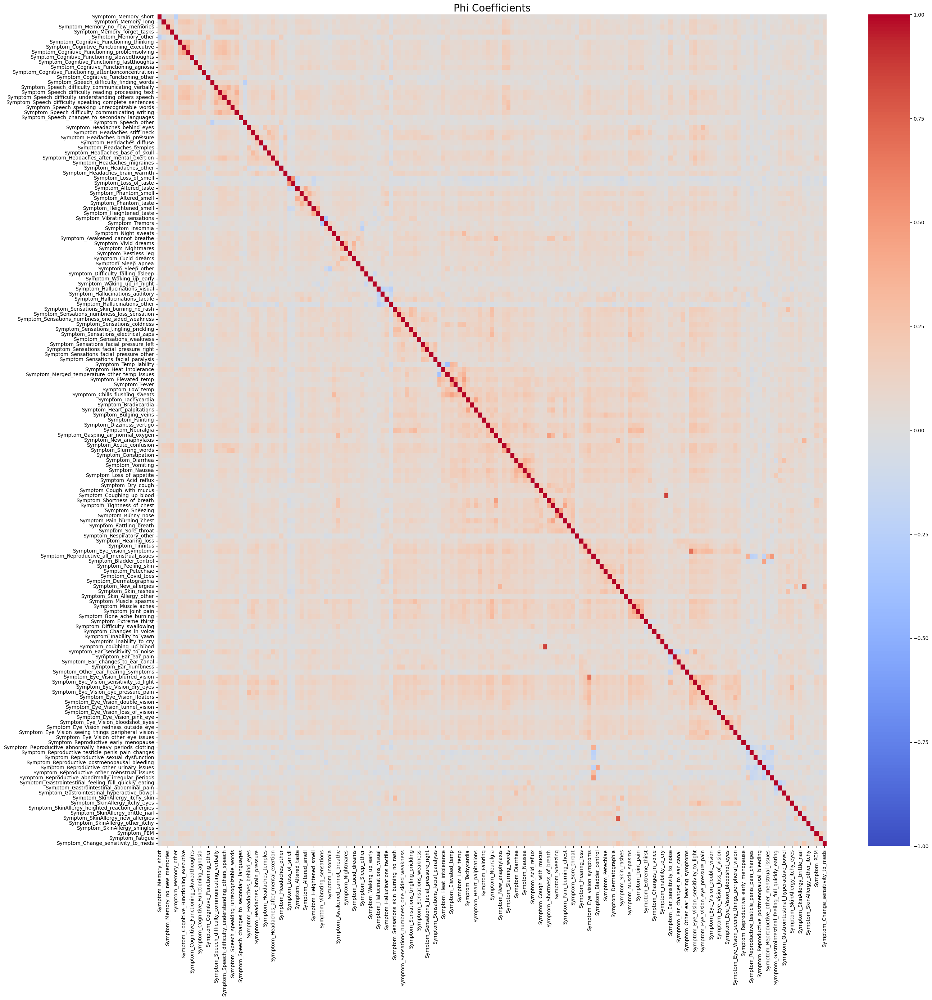

In [7]:
# Remove columns with only one unique value
data_unskewed = data_unskewed.loc[:, data.nunique() != 1]

def phi_coefficient(contingency_table):
    if contingency_table.shape[0] < 2 or contingency_table.shape[1] < 2:
        return 0
    a = contingency_table.iloc[0, 0]
    b = contingency_table.iloc[0, 1]
    c = contingency_table.iloc[1, 0]
    d = contingency_table.iloc[1, 1]
    numerator = (a * d) - (b * c)
    denominator = np.sqrt((a + b) * (a + c) * (b + d) * (c + d))
    return numerator / denominator if denominator != 0 else 0

# Initialize an empty dataframe to store phi values
phi_values = pd.DataFrame(index=data.columns, columns=data.columns)

# Calculate phi values
for col1 in data.columns:
    for col2 in data.columns:
        contingency_table = pd.crosstab(data[col1], data[col2])
        phi = phi_coefficient(contingency_table)
        phi_values.loc[col1, col2] = phi

# Convert to float
phi_values = phi_values.astype(float)

# Plot heatmap
plt.figure(figsize=(30, 30))
sns.heatmap(phi_values, annot=False, cmap='coolwarm', vmin=-1, vmax=1)
plt.title("Phi Coefficients", fontsize=20)
plt.show()



In [8]:
threshold = 0.5  # I decided to set this to 0.5 just based off what feels right, would be interesting to get some clinical input on this.
to_drop = set()  # Interesting to discuss with the team
for col1 in data_unskewed.columns:
    for col2 in data_unskewed.columns:
        if col1 == col2 or (col2, col1) in to_drop:
            continue
        phi_value = abs(phi_values.loc[col1, col2])
        if phi_value > threshold:
            to_drop.add((col1, col2, phi_value))

dropped_columns = set()
lines = ["Dropped Columns and Their Phi Coefficients"]
is_title = [True]
for col1, col2, phi_value in to_drop:
    if col1 not in dropped_columns and col2 not in dropped_columns:
        lines.append(f"Dropping column '{col1}' which has a phi coefficient of {phi_value} with '{col2}'")
        is_title.append(False)
        dropped_columns.add(col1)
print_boxed_text(lines, is_title)

data_drop_corr = data_unskewed.drop(columns=dropped_columns)

┌────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
├────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│                                                               Dropped Columns and Their Phi Coefficients                                                               │
├────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│                                                                                                                                                                        │
│ Dropping column 'Symptom_Reproductive_all_menstrual_issues' which has a phi coefficient of 0.5101093309632552 with 'Symptom_Reproductive_abnorm

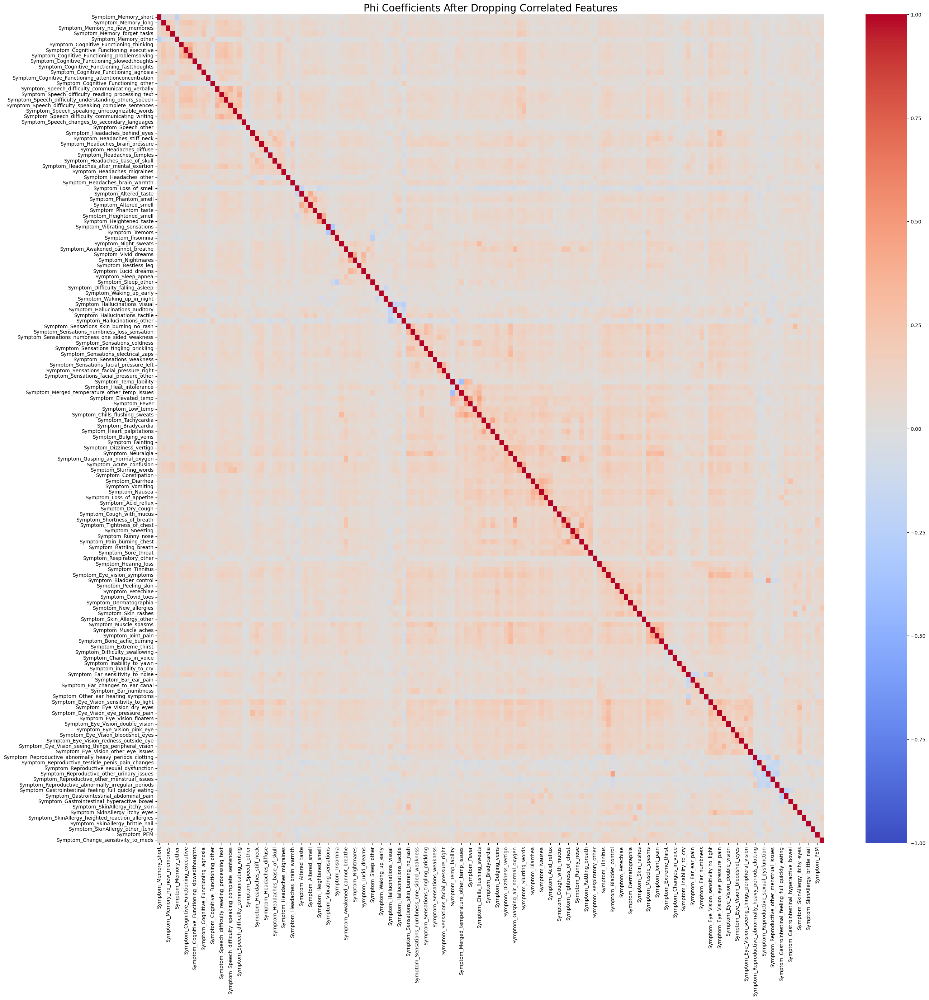

In [9]:
# Initialize an empty dataframe to store phi values for the remaining features
phi_values_after_drop = pd.DataFrame(index=data_drop_corr.columns, columns=data_drop_corr.columns)

# Calculate phi values
for col1 in data_drop_corr.columns:
    for col2 in data_drop_corr.columns:
        contingency_table = pd.crosstab(data_drop_corr[col1], data_drop_corr[col2])
        phi = phi_coefficient(contingency_table)
        phi_values_after_drop.loc[col1, col2] = phi

# Convert to float
phi_values_after_drop = phi_values_after_drop.astype(float)

# Plot heatmap
plt.figure(figsize=(30, 30))
sns.heatmap(phi_values_after_drop, annot=False, cmap='coolwarm', vmin=-1, vmax=1)
plt.title("Phi Coefficients After Dropping Correlated Features", fontsize=20)
plt.show()


In [10]:
#Of the features that are left over, lets look at the ones that are most correlated and least correlated. Useful for deciding on better
#thresholds for dropping features. 

def print_correlated_features(phi_values_df, n=5):
    
    # Flatten the Phi values DataFrame and reset the index
    phi_melted = phi_values_df.reset_index().melt(id_vars='index', var_name='Column2', value_name='Phi')
    
    # Remove self-correlations (where Phi is 1)
    phi_melted = phi_melted[phi_melted['index'] != phi_melted['Column2']]
    
    # Remove duplicate pairs
    phi_melted['Pair'] = phi_melted.apply(lambda row: tuple(sorted([row['index'], row['Column2']])), axis=1)
    phi_melted = phi_melted.drop_duplicates(subset='Pair')
    
    # Sort by Phi value
    phi_melted = phi_melted.sort_values(by='Phi')
    
    # Prepare lines for least correlated pairs
    lines = ["Negatively Correlated Features"]
    is_title = [True]
    for _, row in phi_melted.head(n).iterrows():
        lines.append(f"{row['index']} - {row['Column2']}: {row['Phi']}")
        is_title.append(False)
    print_boxed_text(lines, is_title)
    
    print()
    
    # Prepare lines for most correlated pairs
    lines = ["Positively Correlated Features"]
    is_title = [True]
    for _, row in phi_melted.tail(n).sort_values(by='Phi', ascending=False).iterrows():
        lines.append(f"{row['index']} - {row['Column2']}: {row['Phi']}")
        is_title.append(False)
    print_boxed_text(lines, is_title)

print_correlated_features(phi_values_after_drop, n=5)


┌──────────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
├──────────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│                                            Negatively Correlated Features                                            │
├──────────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│                                                                                                                      │
│ Symptom_Merged_temperature_other_temp_issues - Symptom_Temp_lability: -0.3809160637549662                            │
│ Symptom_Tremors - Symptom_Vibrating_sensations: -0.301581016121916                                                   │
│ Symptom_Sleep_other - Symptom_Insomnia: -0.24180570883257135                                                         │
│ Symptom_Hallucinations_other -

## Hierarchical Clustering

Interesting just to see in a very simple way how features are grouping together.

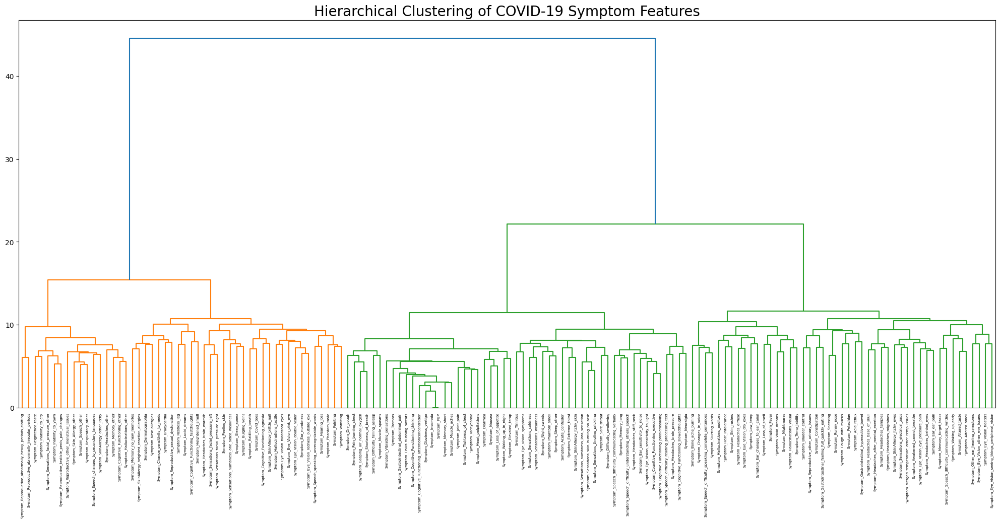

In [11]:
# Create a temporary copy
temp_data = data_drop_corr.dropna()  # Or use temp_data = data.fillna(0)

feature_names = temp_data.columns.tolist()
# Create linkage matrix and dendrogram
Z = linkage(temp_data.T, 'ward')
fig = plt.figure(figsize=(25, 10))
dn = dendrogram(Z, labels=feature_names)

plt.title("Hierarchical Clustering of COVID-19 Symptom Features", size=20)
plt.show()



In [12]:
k = 6  # Setting this based mainly off of intuition I tried caluclating inconsistency coefficient but it was not very helpful
labels = fcluster(Z, k, criterion='maxclust')
clustered_features = pd.Series(index=feature_names, data=labels).sort_values()

# Convert the pandas Series to a list of strings
lines = clustered_features.to_string().split('\n')

# Save the list of strings to a text file using save_boxed_text_to_file
save_boxed_text_to_file(lines, filename="output_tables/clustered_features.txt")

### Programmatic Analysis of Clusters

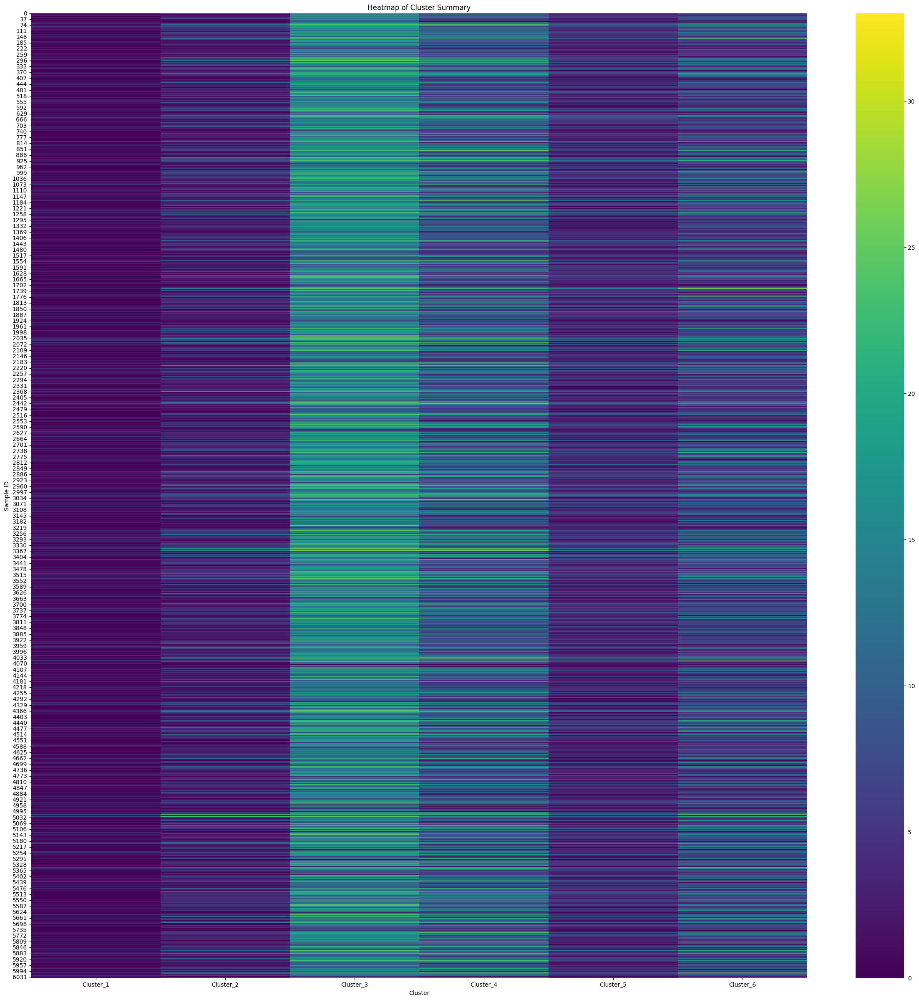

In [13]:
# Create an empty DataFrame to hold the cluster summary
cluster_summary = pd.DataFrame()

# Loop through unique cluster labels
for cluster_label in clustered_features.unique():
    # Find the columns that belong to the cluster
    cluster_columns = clustered_features[clustered_features == cluster_label].index.tolist()
    
    # Sum (or find the mean) of these columns and store in cluster_summary
    cluster_summary[f'Cluster_{cluster_label}'] = data_drop_corr[cluster_columns].sum(axis=1)

plt.figure(figsize=(30, 30))
sns.heatmap(cluster_summary, cmap='viridis', annot=False, fmt=".0f")
plt.title("Heatmap of Cluster Summary")
plt.xlabel("Cluster")
plt.ylabel("Sample ID")
plt.show()

In [20]:
# Calculate the prevalence of each cluster
cluster_prevalence = cluster_summary.mean().sort_values(ascending=False)

#conterting to string for pretty print
cluster_prevalence_str = str(cluster_prevalence).split('\n')

# Add the title line
lines = ['Prevalence of each cluster in the population:'] + cluster_prevalence_str

# Apply the print_boxed_text function
print_boxed_text(lines, is_title=[True] + [False]*len(cluster_prevalence_str))


┌───────────────────────────────────────────────┐
├───────────────────────────────────────────────┤
│ Prevalence of each cluster in the population: │
├───────────────────────────────────────────────┤
│                                               │
│ Cluster_3    14.983596                        │
│ Cluster_4    10.209776                        │
│ Cluster_6     7.588898                        │
│ Cluster_5     4.266280                        │
│ Cluster_2     3.885501                        │
│ Cluster_1     1.239271                        │
│ dtype: float64                                │
└───────────────────────────────────────────────┘


## Dimensionality Reduction

### PCA

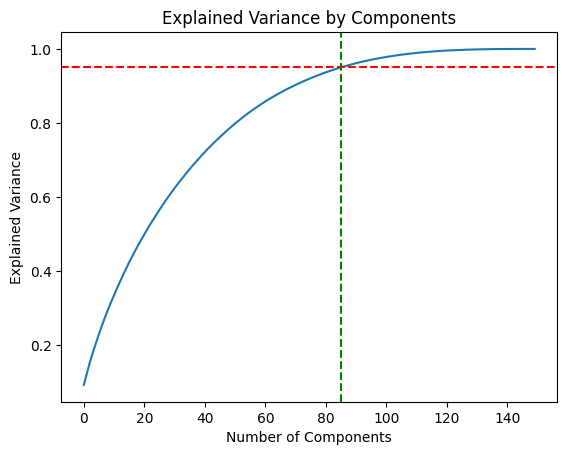

┌──────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────┐
├──────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│                                               The optimal number of components is: 86                                                │
├──────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────┤
│                                                                                                                                      │
│ The optimal number of components is calculated based on the point where the cumulative explained variance crosses the 95% threshold. │
└──────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────────┘


In [16]:
# Fit and transform the data
pca = PCA()
X_pca = pca.fit_transform(temp_data)

# Calculate explained variance
explained_variance = pca.explained_variance_ratio_

# Calculate cumulative explained variance
cumulative_variance = np.cumsum(explained_variance)

# Find the optimal number of components
optimal_n_components = np.argmax(cumulative_variance >= 0.95) + 1

# Plot explained variance
plt.plot(cumulative_variance)
plt.axhline(y=0.95, color='r', linestyle='--')
plt.axvline(x=optimal_n_components - 1, color='g', linestyle='--')
plt.xlabel('Number of Components')
plt.ylabel('Explained Variance')
plt.title('Explained Variance by Components')
plt.show()

# Create a list of strings to print
lines_to_print = [
    "The optimal number of components is: {}".format(optimal_n_components),
    "The optimal number of components is calculated based on the point where the cumulative explained variance crosses the 95% threshold."
]

# Use the print_boxed_text function
print_boxed_text(lines_to_print, is_title=[True, False])


In [17]:
# Display the loadings (components)
loadings = pd.DataFrame(pca.components_, columns=data_drop_corr.columns)
# Show top 10 variables for the first 10 components
# Create an empty list to hold lines for saving
lines_to_save = []

# Add title
lines_to_save.append("Top Contributors for Each Principal Component")
is_title = [True]

# Show top 10 variables for the first 6 components
for i in range(10): 
    component_title = f"Top contributors for component {i+1}"
    lines_to_save.append(component_title)
    is_title.append(True)
    
    top_contributors = loadings.loc[i].sort_values(ascending=False).head(10)
    
    for feature, loading in top_contributors.items():
        line = f"{feature}: {loading:.4f}"
        lines_to_save.append(line)
        is_title.append(False)
        
    # Add empty line for separation
    lines_to_save.append(" ")
    is_title.append(False)

# Save all lines to the same text file
save_boxed_text_to_file(lines_to_save, is_title=is_title, filename="output_tables/top_contributors.txt")


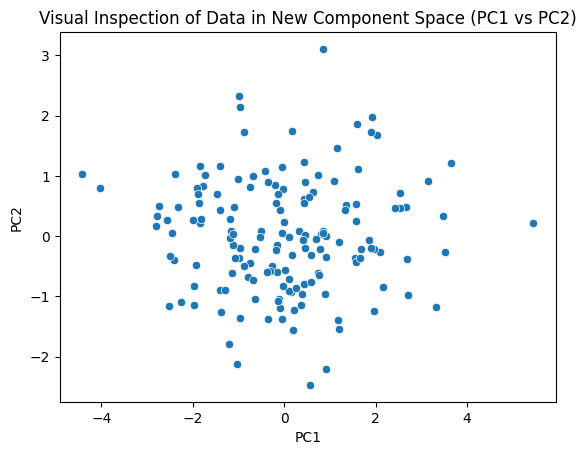

In [18]:
# Converting the PCA results that I got above to a dataframe
pca_df = pd.DataFrame(X_pca, columns=[f'PC{i+1}' for i in range(X_pca.shape[1])])

# Scatter plot for first two principal components
sns.scatterplot(x='PC1', y='PC2', data=pca_df)
plt.title('Visual Inspection of Data in New Component Space (PC1 vs PC2)')
plt.show()

### UMAP

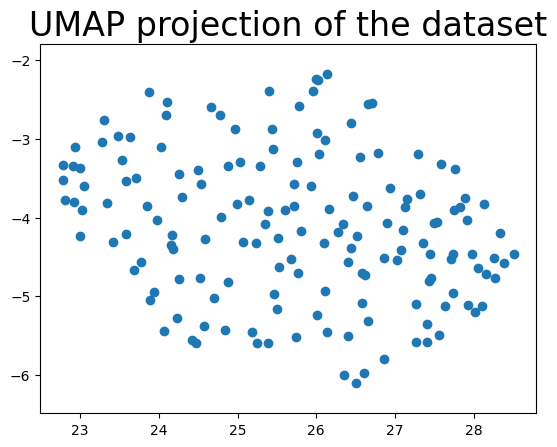

In [19]:
reducer = umap.UMAP()
embedding = reducer.fit_transform(temp_data)

# Plot the results
plt.scatter(embedding[:, 0], embedding[:, 1])
plt.gca().set_aspect('equal', 'datalim')
plt.title('UMAP projection of the dataset', fontsize=24)
plt.show()